$$
Projet \ IVA \\
Macaque \ Pose \ Estimation
$$

$$$$

### Dataset

**Imports**

In [ ]:
import requests
from tqdm import tqdm
import os
import csv
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import json
import zipfile
import seaborn as sns
import pandas as pd


%matplotlib inline
!rm -r sample_data

**Download dataset**

In [ ]:
# URL of the dataset to download
url = "https://www2.ehub.kyoto-u.ac.jp/datasets/macaquepose/download.php"

# Send a GET request to the URL
response = requests.get(url, stream=True)

# Check if the request was successful (status code 200)
if response.status_code == 200:
    # Get the total size of the file from the content-length header
    total_size = int(response.headers.get('content-length', 0))
    bytes_so_far = 0

    # Create a tqdm progress bar
    progress_bar = tqdm(total=total_size, unit='B', unit_scale=True)

    # Save the dataset to a file
    with open("macaquepose.zip", "wb") as file:
        for chunk in response.iter_content(chunk_size=1024):
            if chunk:
                file.write(chunk)
                bytes_so_far += len(chunk)
                progress_bar.update(len(chunk))

    progress_bar.close()
    print("\n Dataset downloaded successfully.")
else:
    print("Failed to download dataset. Status code:", response.status_code)

100%|██████████| 20.7G/20.7G [19:53<00:00, 17.3MB/s]

Dataset downloaded successfully.


In [ ]:
# Path to the downloaded zip file
zip_file_path = "/content/macaquepose.zip"
extracted_dir = "macaquepose"

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_dir)

print("Dataset has been successfully extracted.")
!rm -rf /content/macaquepose.zip

Dataset has been successfully extracted.


$$$$

## EDA

In [ ]:
df = pd.read_csv('/content/macaquepose/v1/annotations.csv')
df

,image file name,keypoinbts,segmentation
0,01418849d54b3005.jpg,"[[{""name"": ""nose"", ""position"": [2337, 1161]}, ...","[[{""segment"":[[172.26,3124.44],[184.14,2863.08..."
1,0142d1d1a6904a70.jpg,"[[{""name"": ""nose"", ""position"": [1317, 1194]}, ...","[[{""segment"":[[1456.89,1350.71],[1490.87,1359...."
2,01ef2c4c260321b7.jpg,"[[{""name"": ""nose"", ""position"": [337, 541]}, {""...","[[{""segment"":[[40.28,988.62],[36.62,970.31],[5..."
3,020a1c75c8c85238.jpg,"[[{""name"": ""nose"", ""position"": [1841.08, 951.7...","[[{""segment"":[[147.29,209.6],[218.1,206.77],[2..."
4,020b1506eef2557d.jpg,"[[{""name"": ""nose"", ""position"": [312, 250]}, {""...","[[{""segment"":[[526.25,340],[506.25,280],[481.2..."
...,...,...,...
13078,ZooD_2457.jpg,"[[{""name"": ""nose"", ""position"": [1669, 932]}, {...","[[{""segment"":[[1153.87,450.56],[1063.21,500.01..."
13079,ZooD_2458.jpg,"[[{""name"": ""nose"", ""position"": null}, {""name"":...","[[{""segment"":[[1545.07,1105.29],[1661.82,1089...."
13080,ZooD_2459.jpg,"[[{""name"": ""nose"", ""position"": [1619, 1294]}, ...","[[{""segment"":[[770.44,1372.58],[708.72,1224.15..."
13081,ZooD_2460.jpg,"[[{""name"": ""nose"", ""position"": null}, {""name"":...","[[{""segment"":[[1409.76,1291.47],[1479.76,1296...."


$$$$

**visualise some examples**

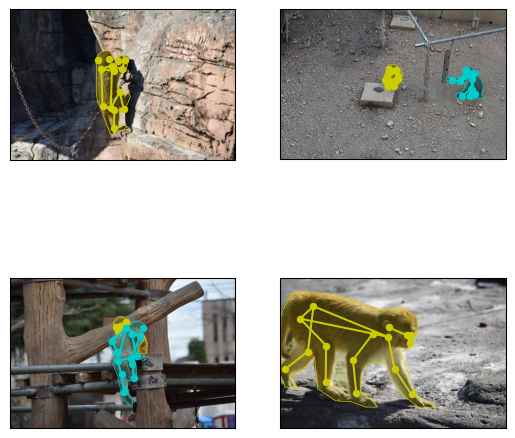

In [ ]:
def drawKp(kp, mrksize, clr, ax):
    cm = plt.get_cmap('hsv', 36)
    kp_con = [{'name':'0_2','color':cm(27), 'bodypart':(0,2)},
            {'name':'0_1','color':cm(31),'bodypart':(0,1)},
            {'name':'2_4','color':cm(29), 'bodypart':(2,4)},
            {'name':'1_3','color':cm(33),'bodypart':(1,3)},
            {'name':'6_8','color':cm(5),'bodypart':(6,8)},
            {'name':'5_7','color':cm(10),'bodypart':(5,7)},
            {'name':'8_10','color':cm(7),'bodypart':(8,10)},
            {'name':'7_9','color':cm(12),'bodypart':(7,9)},
            {'name':'12_14','color':cm(16),'bodypart':(12,14)},
            {'name':'11_13','color':cm(22),'bodypart':(11,13)},
            {'name':'14_16','color':cm(18),'bodypart':(14,16)},
            {'name':'13_15','color':cm(24),'bodypart':(13,15)},
            {'name':'5_6','color':cm(16),'bodypart':(5,6)},
            {'name':'11_12','color':cm(22),'bodypart':(11,12)},
            {'name':'5_11','color':cm(18),'bodypart':(5,11)},
            {'name':'6_12','color':cm(24),'bodypart':(6,12)}]

    for i in reversed(range(len(kp))):
        if kp[i] is not None:
            ax.plot(kp[i][0], kp[i][1], color=clr, marker='o', ms=8*mrksize, alpha=1, markeredgewidth=0)

    for i in reversed(range(len(kp_con))):
        j1 = kp_con[i]['bodypart'][0]
        j2 = kp_con[i]['bodypart'][1]
        if kp[j1] is not None and kp[j2] is not None:
            ax.plot((kp[j1][0], kp[j2][0]), (kp[j1][1], kp[j2][1]), color=clr, ms=0)

def drawSeg(seg, lwid, clr, ax):
    for s in seg:
        poly = np.array(s['segment'], np.float32)
        if len(poly) < 3:
            continue
        p = plt.Polygon(poly, fc = clr, alpha = 0.2)
        ax.add_patch(p)
        p = plt.Polygon(poly, lw = lwid, color=clr, fill=False)
        ax.add_patch(p)

def visualize(n_images=8):
    my_dpi = 96
    C = [(.8, .8, 0),(0, .8, .8),(.8, 0, .8),(0, 1, 0),(0, 0, 1), (1, 0, 0)]

    with open('/content/macaquepose/v1/annotations.csv', 'r') as fp:
        data_annotation = list(csv.reader(fp, delimiter=','))

    fig, axes = plt.subplots(n_images//2, 2, figsize=(640/my_dpi,640/my_dpi),dpi=my_dpi)
    axes = axes.flat
    # print(axes.shape)

    # row = data_annotation[i_image]
    rows = np.random.choice(range(1,len(data_annotation)),replace=False,size=n_images)

    for row_index,row in enumerate(rows):
        # load & draw image
        row = data_annotation[row]
        img = np.asarray(Image.open('/content/macaquepose/v1/images/' + row[0]))
        # print(img.shape)

        ax = axes[row_index]
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(img)

        # load & draw keypoint
        kp_string= row[1]
        Kp = json.loads(kp_string)
        for i_monkey, kp in enumerate(Kp):
            kp2 = []
            for p in kp:
                kp2.append(p['position'])
            drawKp(kp2, 0.7, C[i_monkey%6], ax)

        # load & draw segmentation
        seg_string= row[2]
        Seg = json.loads(seg_string)

        for i_monkey, seg in enumerate(Seg):
            drawSeg(seg, 0.5, C[i_monkey%6], ax)

    # plt.axis('off')
    plt.show()

# the input number = image index
visualize(n_images=4)

**parse keypoints**

In [ ]:
tqdm.pandas()
def parse_keypoints(keypoint):
  data = json.loads(keypoint)
  return np.array(data)

df['keypoints'] = df['keypoinbts'].progress_apply(parse_keypoints)

100%|██████████| 13083/13083 [00:01<00:00, 6713.49it/s] 


**Keypoints example**

In [ ]:
df['keypoints'][0]

array([[{'name': 'nose', 'position': [2337, 1161]},
        {'name': 'left eye', 'position': [1972, 913]},
        {'name': 'right eye', 'position': [1752.3, 1021.68]},
        {'name': 'left ear', 'position': None},
        {'name': 'right ear', 'position': [1027, 1675]},
        {'name': 'left shoulder', 'position': None},
        {'name': 'right shoulder', 'position': [1536, 2680]},
        {'name': 'left elbow', 'position': None},
        {'name': 'right elbow', 'position': [2652, 3285]},
        {'name': 'left wrist', 'position': None},
        {'name': 'right wrist', 'position': [3069, 1823]},
        {'name': 'left hip', 'position': None},
        {'name': 'right hip', 'position': None},
        {'name': 'left knee', 'position': None},
        {'name': 'right knee', 'position': None},
        {'name': 'left ankle', 'position': None},
        {'name': 'right ankle', 'position': None}]], dtype=object)

In [ ]:
df['keypoints'][0].shape

(1, 17)

**Extract Images sizes**

In [ ]:
def img_size(img_path):
  img = np.asarray(Image.open('/content/macaquepose/v1/images/' + img_path))
  return img.shape

df['image size'] = df['image file name'].progress_apply(img_size)
df

100%|██████████| 13083/13083 [14:59<00:00, 14.54it/s]


,image file name,keypoinbts,segmentation,keypoints,image size
0,01418849d54b3005.jpg,"[[{""name"": ""nose"", ""position"": [2337, 1161]}, ...","[[{""segment"":[[172.26,3124.44],[184.14,2863.08...","[[{'name': 'nose', 'position': [2337, 1161]}, ...","(3168, 4752, 3)"
1,0142d1d1a6904a70.jpg,"[[{""name"": ""nose"", ""position"": [1317, 1194]}, ...","[[{""segment"":[[1456.89,1350.71],[1490.87,1359....","[[{'name': 'nose', 'position': [1317, 1194]}, ...","(2276, 3399, 3)"
2,01ef2c4c260321b7.jpg,"[[{""name"": ""nose"", ""position"": [337, 541]}, {""...","[[{""segment"":[[40.28,988.62],[36.62,970.31],[5...","[[{'name': 'nose', 'position': [337, 541]}, {'...","(1264, 1089, 3)"
3,020a1c75c8c85238.jpg,"[[{""name"": ""nose"", ""position"": [1841.08, 951.7...","[[{""segment"":[[147.29,209.6],[218.1,206.77],[2...","[[{'name': 'nose', 'position': [1841.08, 951.7...","(2737, 3221, 3)"
4,020b1506eef2557d.jpg,"[[{""name"": ""nose"", ""position"": [312, 250]}, {""...","[[{""segment"":[[526.25,340],[506.25,280],[481.2...","[[{'name': 'nose', 'position': [312, 250]}, {'...","(667, 1000, 3)"
...,...,...,...,...,...
13078,ZooD_2457.jpg,"[[{""name"": ""nose"", ""position"": [1669, 932]}, {...","[[{""segment"":[[1153.87,450.56],[1063.21,500.01...","[[{'name': 'nose', 'position': [1669, 932]}, {...","(2000, 2992, 3)"
13079,ZooD_2458.jpg,"[[{""name"": ""nose"", ""position"": null}, {""name"":...","[[{""segment"":[[1545.07,1105.29],[1661.82,1089....","[[{'name': 'nose', 'position': None}, {'name':...","(2000, 2992, 3)"
13080,ZooD_2459.jpg,"[[{""name"": ""nose"", ""position"": [1619, 1294]}, ...","[[{""segment"":[[770.44,1372.58],[708.72,1224.15...","[[{'name': 'nose', 'position': [1619, 1294]}, ...","(2000, 2992, 3)"
13081,ZooD_2460.jpg,"[[{""name"": ""nose"", ""position"": null}, {""name"":...","[[{""segment"":[[1409.76,1291.47],[1479.76,1296....","[[{'name': 'nose', 'position': None}, {'name':...","(2000, 2992, 3)"


$$$$

**Number of keypoints per category that are labeled**

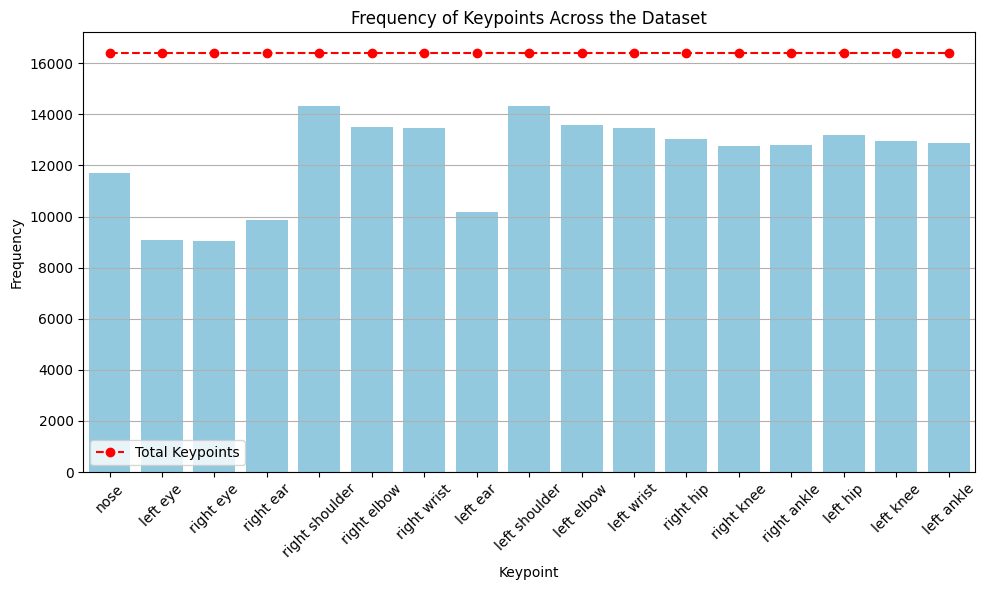

In [ ]:
plt.style.use('default')

# Extract keypoint names
# Count the occurrences of each keypoint, considering None values
keypoint_counts = {}
keypoints_none = {}
keypoints_total = {}
for keypoints in df['keypoints']: # groupe de points
    for bodyposition in keypoints:
      for point in bodyposition:
          name = point['name']
          keypoints_total[name] = keypoints_total.get(name, 0) + 1
          if point['position'] is not None:
              keypoint_counts[name] = keypoint_counts.get(name, 0) + 1
          else:
            keypoints_none[name] = keypoints_none.get(name, 0) + 1


total_keypoints = [keypoints_total[key] for key in keypoint_counts.keys()]
plt.figure(figsize=(10, 6))
plt.plot(total_keypoints, color='red', linestyle='--', marker='o', label='Total Keypoints')
sns.barplot(x=list(keypoint_counts.keys()), y=list(keypoint_counts.values()), color='skyblue')
plt.xlabel('Keypoint')
plt.ylabel('Frequency')
plt.title('Frequency of Keypoints Across the Dataset')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

$$$$

**Number of mislabeled keypoints per catgory**

In [ ]:
def check_keypoints(row):
  res = []
  for _,row in df.iterrows():
      img_path = row['image file name'] # name of the txt file
      height, width, _ = row['image size']
      keypoints = row['keypoints']
      for kp in keypoints:
        for p in kp:
          name = p['name']
          p = p['position']
          if p is not None:
            px = p[0]
            py = p[1]
            if px > width:
              res.append({
                  'image path': img_path,
                  'name': name,
                  'height':None,
                  'width': width,
                  'px': px,
                  'py': py
              })
              continue
            if py > height:
              res.append({
                  'image path': img_path,
                  'name': name,
                  'height':height,
                  'width': None,
                  'px': px,
                  'py': py
              })
              continue
  return pd.DataFrame(res)

keypoints_wrong_df = check_keypoints(df)
keypoints_wrong_df

,image path,name,height,width,px,py
0,01418849d54b3005.jpg,right elbow,3168.0,NaN,2652,3285
1,0c58303601bfe7c9.jpg,right ankle,3728.0,NaN,437,4144
2,0d4eb82a2d639d39.jpg,right elbow,3456.0,NaN,1924,3557
3,36733cdb5f4af01e.jpg,right wrist,1536.0,NaN,466,1540
4,369164910eb3151b.jpg,left wrist,1760.0,NaN,1606,1812
...,...,...,...,...,...,...
89,ZooD_1012.jpg,left ankle,1812.0,NaN,601,1857
90,ZooD_1085.jpg,left ankle,2000.0,NaN,1029,2010
91,ZooD_1290.jpg,left ankle,2000.0,NaN,1457,2005
92,ZooD_1415.jpg,right wrist,2000.0,NaN,1137,2034


<Figure size 1200x800 with 0 Axes>

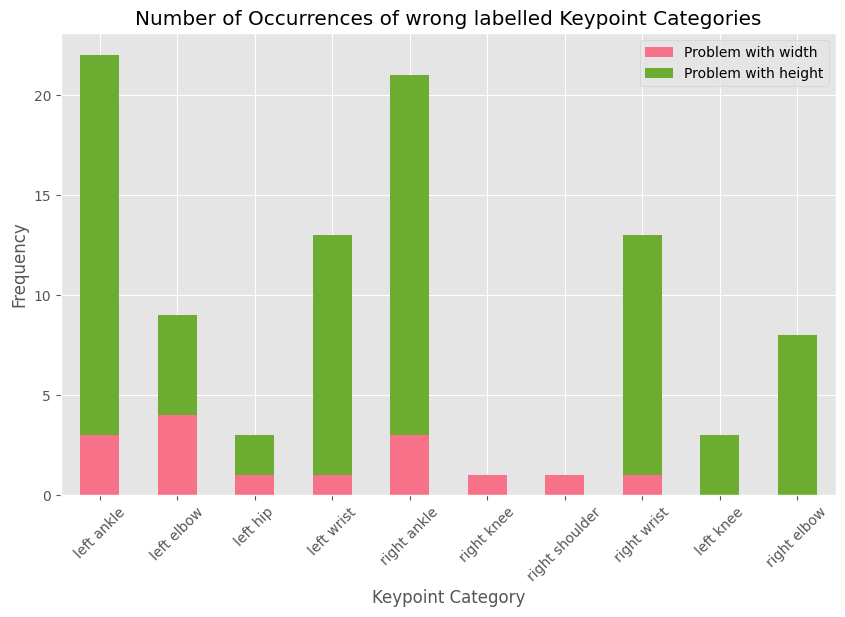

In [ ]:
plt.style.use('ggplot')
def visualize_wrong_keypoint_categories(df):
    # Count occurrences of each category
    category_counts_height = df[df['height'].isnull()].groupby('name').size().reset_index(name='Problem with width')
    category_counts_width = df[df['width'].isnull()].groupby('name').size().reset_index(name='Problem with height')

    # Merge counts by category
    merged_counts = pd.merge(category_counts_height, category_counts_width, on='name', how='outer').fillna(0)

    # Plot the bar plot
    plt.figure(figsize=(12, 8))
    ax = merged_counts.plot(x='name', y=['Problem with width', 'Problem with height'], kind='bar', stacked=True,
                              color=[palette[0], palette[5]], figsize=(10, 6))
    ax.set_title('Number of Occurrences of wrong labelled Keypoint by Category')
    ax.set_xlabel('Keypoint Category')
    ax.set_ylabel('Frequency')
    plt.xticks(rotation=45)
    plt.show()

visualize_wrong_keypoint_categories(keypoints_wrong_df)

$$$$

**Number of individuals per Image**

100%|██████████| 13083/13083 [00:00<00:00, 177896.90it/s]


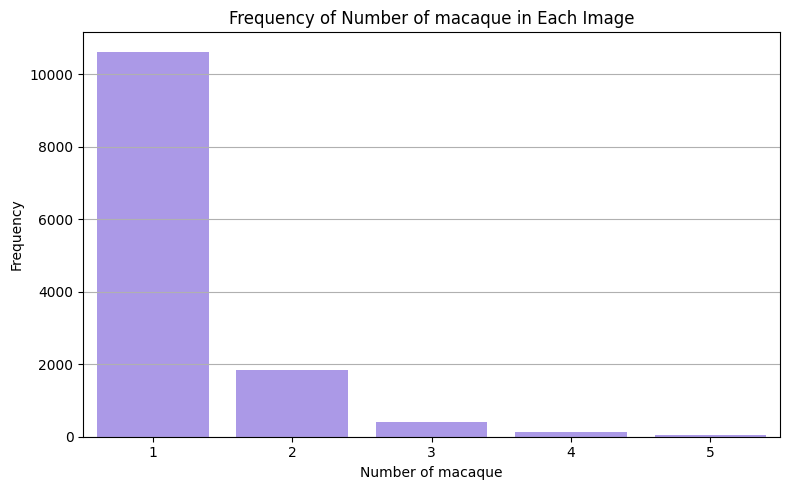

In [ ]:
num_individuals = df['keypoints'].progress_apply(lambda x: x.shape[0])
plt.figure(figsize=(8, 5))


sns.countplot(x=num_individuals, color=palette[-4])
plt.xlabel('Number of macaque')
plt.ylabel('Frequency')
plt.title('Frequency of Number of macaque in Each Image')
plt.grid(axis='y')
plt.tight_layout()
plt.show()

$$$$

**Distribution of images sizes**

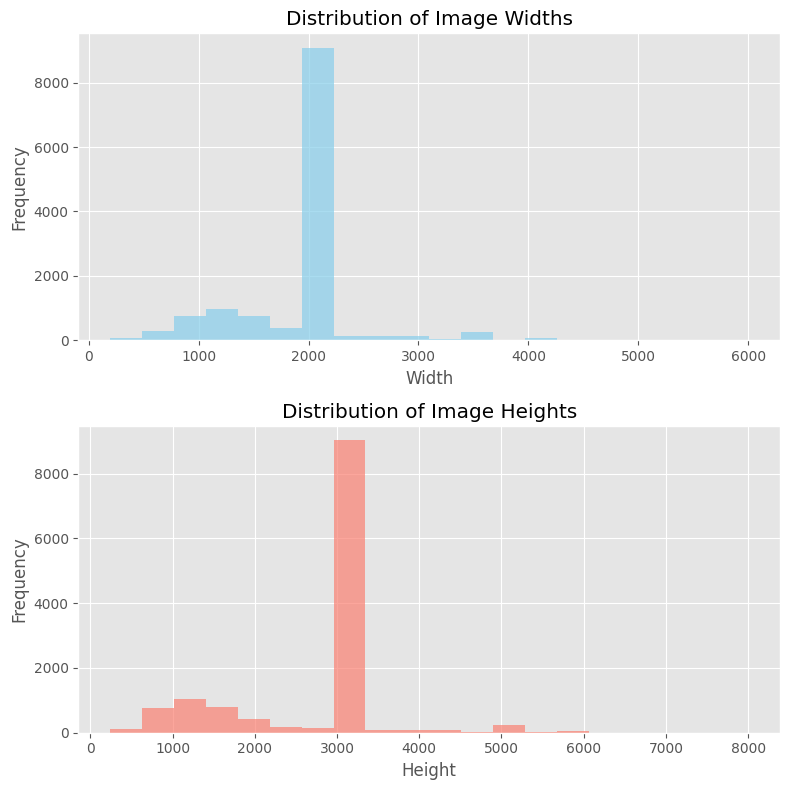

In [ ]:
plt.style.use('ggplot')
sizes = df['image size'].tolist()

# Extract width and height separately
widths = [size[0] for size in sizes]
heights = [size[1] for size in sizes]

# Create a figure with subplots for width and height histograms
fig, axes = plt.subplots(2, 1, figsize=(8, 8))

# Plot histogram for widths
axes[0].hist(widths, bins=20, color='skyblue', alpha=0.7)
axes[0].set_title('Distribution of Image Widths')
axes[0].set_xlabel('Width')
axes[0].set_ylabel('Frequency')

# Plot histogram for heights
axes[1].hist(heights, bins=20, color='salmon', alpha=0.7)
axes[1].set_title('Distribution of Image Heights')
axes[1].set_xlabel('Height')
axes[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

$$$$

**Keypoints Distribution**

In [ ]:
def create_normalized_df(df):
    normalized_data = []
    for index, row in tqdm(df.iterrows()):
        img_shape = row['image size']
        width, height = img_shape[1], img_shape[0]

        for keypoints in row['keypoints']:
              for point in keypoints:
                  name = point['name']
                  if point['position'] is not None:
                    x, y = point['position']
                    # Normalize x and y positions
                    normalized_x = x / width
                    normalized_y = y / height

                    # Append normalized data to list
                    normalized_data.append({'Normalized_X': normalized_x, 'Normalized_Y': normalized_y,'Name': name})

    # Create DataFrame from normalized data
    normalized_df = pd.DataFrame(normalized_data)
    return normalized_df

# Example usage
position_df = create_normalized_df(df)
position_df

13083it [00:00, 13745.05it/s]


,Normalized_X,Normalized_Y,Name
0,0.491793,0.366477,nose
1,0.414983,0.288194,left eye
2,0.368750,0.322500,right eye
3,0.216120,0.528725,right ear
4,0.323232,0.845960,right shoulder
...,...,...,...
210139,0.533422,0.524500,right hip
210140,0.444602,0.600760,left knee
210141,0.489973,0.563500,right knee
210142,0.466116,0.701905,left ankle


In [ ]:
grouped

Normalized_X           Normalized_Y          
                       mean       std         mean       std
Name                                                        
left ankle         0.508351  0.176445     0.664923  0.141602
left ear           0.476204  0.151043     0.372346  0.133920
left elbow         0.516425  0.141218     0.542150  0.124501
left eye           0.473791  0.155394     0.402318  0.134490
left hip           0.509573  0.177878     0.503656  0.173065
left knee          0.507119  0.153522     0.559127  0.123142
left shoulder      0.499614  0.141730     0.419171  0.123054
left wrist         0.503135  0.150007     0.625485  0.150870
nose               0.485853  0.164394     0.442438  0.134812
right ankle        0.480439  0.176927     0.664181  0.142636
right ear          0.492888  0.150550     0.372386  0.134002
right elbow        0.465660  0.138651     0.544160  0.124177
right eye          0.498266  0.155924     0.401960  0.135236
right hip          0.472393  0.176770     0.502220  0.173280
right knee         0.474723  0.154046     0.560159  0.122719
right shoulder     0.476253  0.139359     0.415452  0.123700
right wrist        0.481035  0.148389     0.626948  0.149724

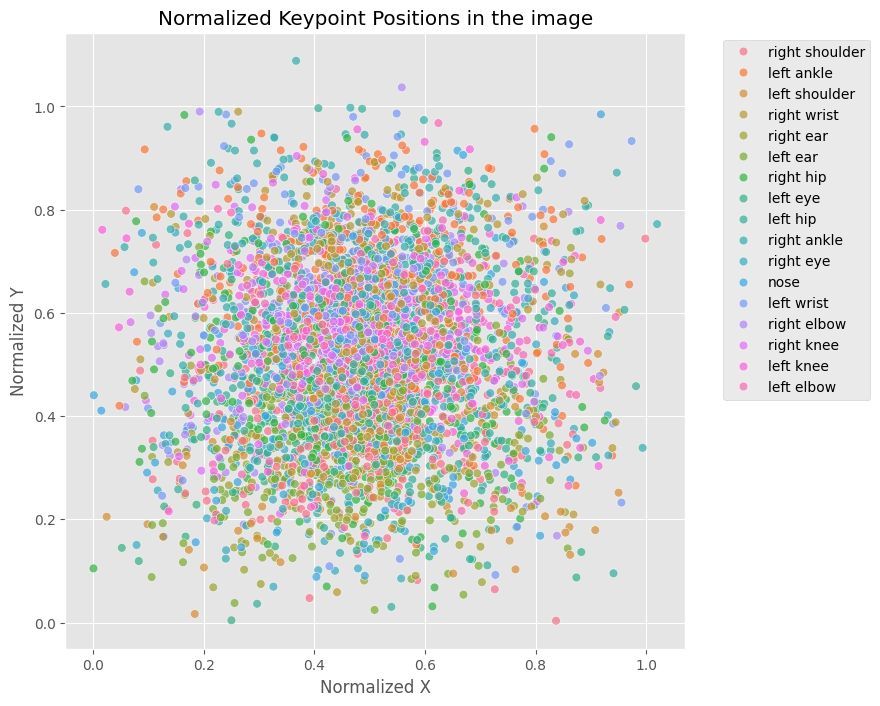

In [ ]:
plt.style.use('ggplot')
plt.figure(figsize=(8, 8))
sns.scatterplot(data=position_df.sample(5000), x='Normalized_X', y='Normalized_Y', hue='Name', palette=sns.color_palette("husl", 17)
, s=40,alpha=0.7)
plt.title('Normalized Keypoint Positions in the image')
plt.xlabel('Normalized X')
plt.ylabel('Normalized Y')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

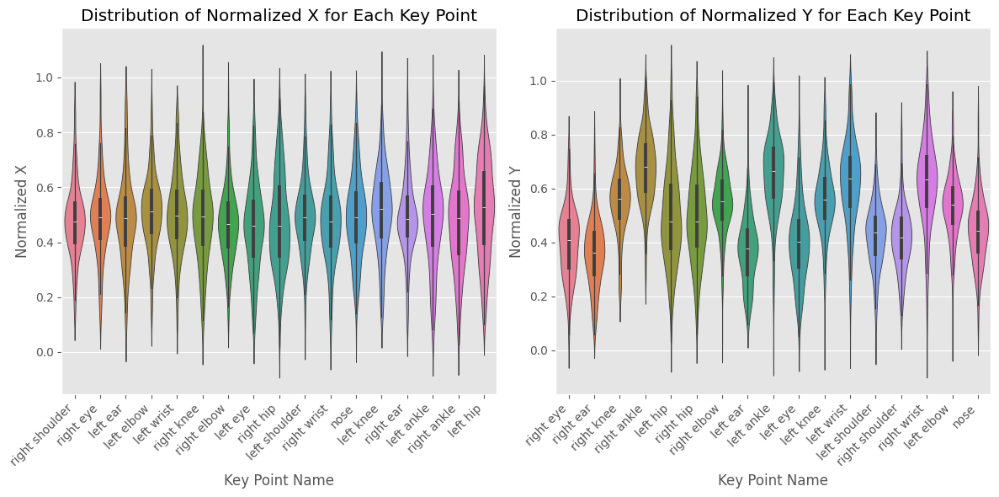

In [ ]:
# Set ggplot style
plt.style.use('ggplot')

# Create a violin plot
plt.figure(figsize=(12, 6))
plt.subplot(121)
sns.violinplot(data=position_df.sample(5000), x='Name', y='Normalized_X', palette='husl',hue='Name')
plt.title('Distribution of Normalized X for Each Key Point')
plt.xlabel('Key Point Name')
plt.ylabel('Normalized X')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability

# Create another violin plot for Normalized Y
plt.subplot(122)
sns.violinplot(data=position_df.sample(5000), x='Name', y='Normalized_Y', palette='husl',hue='Name')
plt.title('Distribution of Normalized Y for Each Key Point')
plt.xlabel('Key Point Name')
plt.ylabel('Normalized Y')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

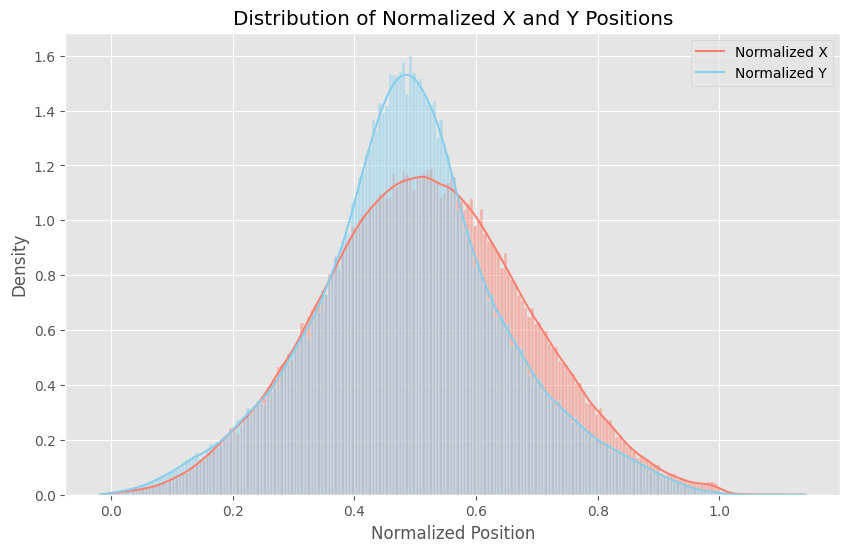

In [ ]:
# Combine normalized x and y positions into a single DataFrame for plotting
combined_normalized_df = pd.concat([position_df['Normalized_X'], position_df['Normalized_Y']], axis=1, keys=['Normalized_X', 'Normalized_Y'])

# Plot distribution of normalized x and y positions together
plt.figure(figsize=(10, 6))
sns.histplot(data=combined_normalized_df, kde=True, palette=['skyblue', 'salmon'], stat='density')
plt.title('Distribution of Normalized X and Y Positions')
plt.xlabel('Normalized Position')
plt.ylabel('Density')
plt.legend(['Normalized X', 'Normalized Y'])
plt.grid(True)
plt.show()

$$$$

**Keypoints Distribution per Category**

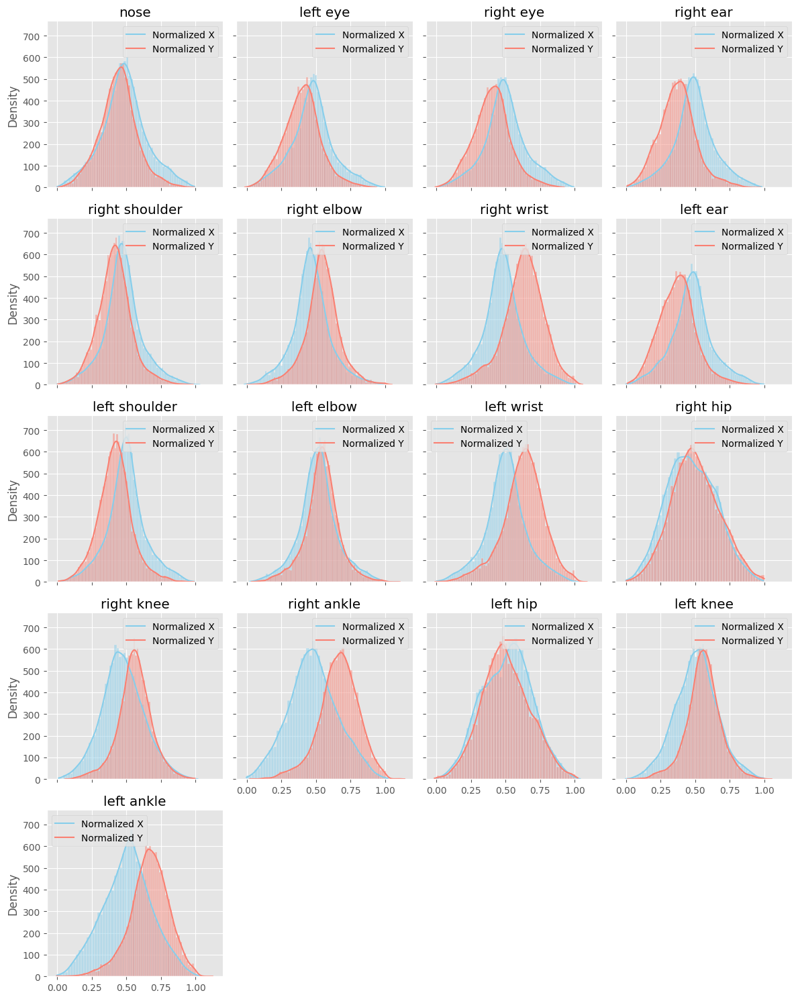

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Function to plot histograms for each category of keypoints in separate subplots
def plot_keypoint_histograms_separate(normalized_df):
    # Get unique categories of keypoints
    categories = normalized_df['Name'].unique()

    # Create a FacetGrid with separate subplots for each category
    g = sns.FacetGrid(normalized_df, col='Name', col_wrap=4, height=3)

    # Plot histograms for each category
    g.map_dataframe(sns.histplot, x='Normalized_X', kde=True, color='skyblue', alpha=0.5)
    g.map_dataframe(sns.histplot, x='Normalized_Y', kde=True, color='salmon', alpha=0.5)

    # Set titles for each subplot
    for ax, category in zip(g.axes.flat, categories):
        ax.set_title(category)
        ax.legend(['Normalized X', 'Normalized Y'])
    # Set common labels and adjust spacing
    g.set_axis_labels('', 'Density')
    g.tight_layout()
    plt.show()

# Example usage
plot_keypoint_histograms_separate(position_df)

$$$$

$$$$

## YOLOv8 annotations

In [ ]:
from shutil import copy

In [ ]:
def find_bounding_box(segmentation):
    min_x = min(point[0] for point in segmentation)
    max_x = max(point[0] for point in segmentation)
    min_y = min(point[1] for point in segmentation)
    max_y = max(point[1] for point in segmentation)
    return min_x, min_y, max_x, max_y

$$$$

**Extract keypoints and bbox**

(462, 695, 3)


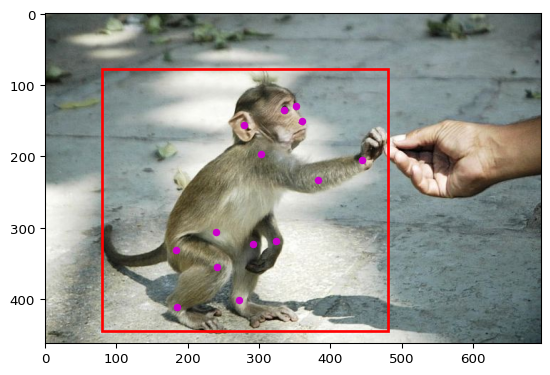

In [ ]:
plt.style.use('default')
row_index = 13
row = data_annotation[row_index]
img = np.asarray(Image.open('/content/macaquepose/v1/images/' + row[0]))
print(img.shape)
my_dpi = 96
fig, ax = plt.subplots(figsize=(640/my_dpi, 640/my_dpi), dpi=my_dpi)
segment = json.loads(row[2])

# plot keypoints
Kp = json.loads(row[1])
kp2 = []
for kp in Kp:
        for p in kp:
            kp2.append(p['position'])
for i in reversed(range(len(kp2))):
        if kp2[i] is not None:
            ax.plot(kp2[i][0], kp2[i][1], color=(0.8, 0, 0.8), marker='o', ms=8*0.7, alpha=1, markeredgewidth=0)

# plot bbox
for s in segment:
  s = s[0]['segment']
  min_x, min_y, max_x, max_y = find_bounding_box(s)
  rect = plt.Rectangle((min_x, min_y), max_x - min_x, max_y - min_y, linewidth=2, edgecolor='r', facecolor='none')
  ax.add_patch(rect)

ax.imshow(img)
plt.show()

$$$$

**images with more than one macaque in the image**

In [ ]:
tem_df = tem_df[tem_df['num_individuals']>2]
tem_df

,image file name,keypoinbts,segmentation,keypoints,image size,num_individuals
9,029a7769836f68f1.jpg,"[[{""name"": ""nose"", ""position"": [468, 275]}, {""...","[[{""segment"":[[448.35,249.97],[452.65,250.63],...","[[{'name': 'nose', 'position': [468, 275]}, {'...","(610, 895, 3)",5
13,02d017c095628da6.jpg,"[[{""name"": ""nose"", ""position"": [745.5, 242.29]...","[[{""segment"":[[698.91,46.59],[646.72,44.73],[6...","[[{'name': 'nose', 'position': [745.5, 242.29]...","(749, 1491, 3)",4
20,04a8ab7928af7ffd.jpg,"[[{""name"": ""nose"", ""position"": [1360, 1321]}, ...","[[{""segment"":[[1667.5,800],[1627.5,750],[1572....","[[{'name': 'nose', 'position': [1360, 1321]}, ...","(1500, 2000, 3)",4
21,04aeef8ee86a7228.jpg,"[[{""name"": ""nose"", ""position"": [32, 234]}, {""n...","[[{""segment"":[[151.44,44.96],[108.85,37.86],[7...","[[{'name': 'nose', 'position': [32, 234]}, {'n...","(859, 1893, 3)",5
24,053a9567f1e17f83.jpg,"[[{""name"": ""nose"", ""position"": [662, 1033]}, {...","[[{""segment"":[[594.88,915.2],[623.04,897.6],[6...","[[{'name': 'nose', 'position': [662, 1033]}, {...","(2112, 2816, 3)",3
...,...,...,...,...,...,...
12873,ZooD_2252.jpg,"[[{""name"": ""nose"", ""position"": null}, {""name"":...","[[{""segment"":[[1492.7,757.08],[1440.6,723.36],...","[[{'name': 'nose', 'position': None}, {'name':...","(2000, 2992, 3)",3
12904,ZooD_2283.jpg,"[[{""name"": ""nose"", ""position"": [1822.16, 467.9...","[[{""segment"":[[1865.89,516.71],[1869.08,593.26...","[[{'name': 'nose', 'position': [1822.16, 467.9...","(2000, 2992, 3)",3
12947,ZooD_2326.jpg,"[[{""name"": ""nose"", ""position"": [997.8, 332.6]}...","[[{""segment"":[[1106.09,152.12],[990.07,208.84]...","[[{'name': 'nose', 'position': [997.8, 332.6]}...","(1796, 1752, 3)",3
12962,ZooD_2341.jpg,"[[{""name"": ""nose"", ""position"": [715, 821]}, {""...","[[{""segment"":[[788,854.48],[783.07,768.3],[770...","[[{'name': 'nose', 'position': [715, 821]}, {'...","(2000, 2992, 3)",4


$$$$

**Verfiy some images with wrong labeled keypoints**

py: 1.0050236406619386 name= left hip img_height=3384 py=3401
py: 1.0319148936170213 name= left ankle img_height=3384 py=3492
py: 1.0195035460992907 name= right ankle img_height=3384 py=3450
py: 1.0159574468085106 name= right ankle img_height=3384 py=3438


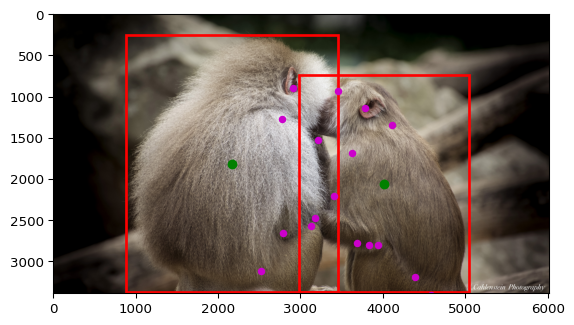

In [ ]:
plt.style.use('default')
my_dpi = 96
fig, ax = plt.subplots(figsize=(640/my_dpi, 640/my_dpi), dpi=my_dpi)

row = df.iloc[325]

# image
img_path = row['image file name'] # name of the txt file
img = np.asarray(Image.open('/content/macaquepose/v1/images/' + img_path))
img_path = img_path.replace('.jpg','')
output_filename = os.path.join(img_path + '.txt')
# size of the image
height, width, _ = row['image size']

# plot bbox
segment = row['segmentation']
segment = json.loads(segment)
Kp = row['keypoints']
if Kp.shape[0] == len(segment):
  pass
else:
  raise ValueError('Shape Mismatch')

with open(output_filename, 'w') as output_file:

    for s,kp in zip(segment,Kp):
      s = s[0]['segment']
      min_x, min_y, max_x, max_y = find_bounding_box(s)

      # normalise the coords
      w = max_x - min_x
      h = max_y - min_y
      w = w / width
      h = h / height

      # detremine the center of the bbox
      center_x = (min_x + max_x) / 2
      center_y = (min_y + max_y) / 2
      # normalise the center
      center_x_normalised = center_x / width
      center_y_normalised = center_y / height

      # write to file
      output_file.write(f'{0} {center_x_normalised} {center_y_normalised} {w} {h}')

      # plot the coords
      rect = plt.Rectangle((min_x, min_y), max_x - min_x, max_y - min_y, linewidth=2, edgecolor='r', facecolor='none')
      ax.add_patch(rect)
      ax.scatter(center_x, center_y, color='green', marker='o', s=40)

      for p in kp:
              name = p['name']
              p = p['position']

              if p is not None:
                  px = p[0] / width
                  py = p[1] / height
                  if px >= 1:
                    print(f'px: {px} name= {name} img_width={img.shape[1]} px={p[0]}')
                  if py >= 1:
                     print(f'py: {py} name= {name} img_height={img.shape[0]} py={p[1]}')
                  output_file.write(f" {px} {py} {2.0}")
                  # plot keypoints
                  ax.plot(p[0], p[1], color=(0.8, 0, 0.8), marker='o', ms=8*0.7, alpha=1, markeredgewidth=0)
              else:
                output_file.write(" 0.0 0.0 0.0")


      output_file.write("\n")

ax.imshow(img)
plt.show()""

$$$$

**Draw keypoints and bbox**

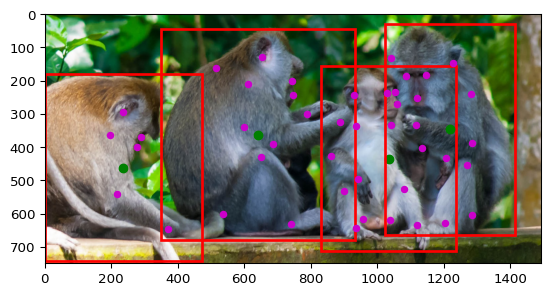

In [ ]:
plt.style.use('default')
my_dpi = 96
fig, ax = plt.subplots(figsize=(640/my_dpi, 640/my_dpi), dpi=my_dpi)

row = df.iloc[13]

# image
img_path = row['image file name'] # name of the txt file
img = np.asarray(Image.open('/content/macaquepose/v1/images/' + img_path))
img_path = img_path.replace('.jpg','')
output_filename = os.path.join(img_path + '.txt')
# size of the image
height, width, _ = row['image size']

# plot bbox
segment = row['segmentation']
segment = json.loads(segment)
Kp = row['keypoints']
if Kp.shape[0] == len(segment):
  pass
else:
  raise ValueError('Shape Mismatch')

with open(output_filename, 'w') as output_file:

    for s,kp in zip(segment,Kp):
      s = s[0]['segment']
      min_x, min_y, max_x, max_y = find_bounding_box(s)

      # normalise the coords
      w = max_x - min_x
      h = max_y - min_y
      w = w / width
      h = h / height

      # detremine the center of the bbox
      center_x = (min_x + max_x) / 2
      center_y = (min_y + max_y) / 2
      # normalise the center
      center_x_normalised = center_x / width
      center_y_normalised = center_y / height

      # write to file
      output_file.write(f'{0} {center_x_normalised} {center_y_normalised} {w} {h}')

      # plot the coords
      rect = plt.Rectangle((min_x, min_y), max_x - min_x, max_y - min_y, linewidth=2, edgecolor='r', facecolor='none')
      ax.add_patch(rect)
      ax.scatter(center_x, center_y, color='green', marker='o', s=40)

      for p in kp:
              p = p['position']
              if p is not None:
                  px = p[0] / width
                  py = p[1] / height
                  output_file.write(f" {px} {py} {2.0}")
                  # plot keypoints
                  ax.plot(p[0], p[1], color=(0.8, 0, 0.8), marker='o', ms=8*0.7, alpha=1, markeredgewidth=0)
              else:
                output_file.write(" 0.0 0.0 0.0")


      output_file.write("\n")

ax.imshow(img)
plt.show()

**Verification of the conversion process**

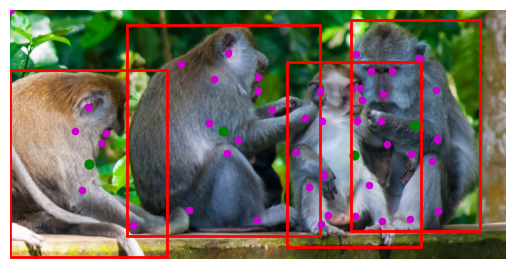

In [ ]:
# Function to parse YOLOv8 Pose annotations
def parse_yolov8_pose_annotations(annotation_file):
    with open(annotation_file, 'r') as file:
        lines = file.readlines()

    annotations = []
    for line in lines:
        line = line.strip().split()
        class_id = int(line[0])
        bbox_center_x = float(line[1])
        bbox_center_y = float(line[2])
        bbox_width = float(line[3])
        bbox_height = float(line[4])
        keypoints = [(float(line[i]), float(line[i+1]), float(line[i+2])) for i in range(5, len(line), 3)]
        annotations.append({'class_id': class_id, 'bbox_center_x': bbox_center_x, 'bbox_center_y': bbox_center_y,
                            'bbox_width': bbox_width, 'bbox_height': bbox_height, 'keypoints': keypoints})

    return annotations

# Function to plot image with annotations
def plot_image_with_annotations(image, annotations):
    plt.imshow(image)
    for annotation in annotations:
        bbox_center_x = annotation['bbox_center_x'] * image.shape[1]
        bbox_center_y = annotation['bbox_center_y'] * image.shape[0]
        bbox_width = annotation['bbox_width'] * image.shape[1]
        bbox_height = annotation['bbox_height'] * image.shape[0]
        bbox_x = bbox_center_x - bbox_width / 2
        bbox_y = bbox_center_y - bbox_height / 2
        # draw center
        plt.scatter(bbox_center_x, bbox_center_y, color='green', marker='o', s=40)
        # draw rectangle
        bbox_rect = plt.Rectangle((bbox_x, bbox_y), bbox_width, bbox_height, linewidth=2, edgecolor='r', facecolor='none')
        plt.gca().add_patch(bbox_rect)
        # draw keypoints
        for keypoint in annotation['keypoints']:
            keypoint_x = keypoint[0] * image.shape[1]
            keypoint_y = keypoint[1] * image.shape[0]
            plt.scatter(keypoint_x, keypoint_y, color=(0.8, 0, 0.8), marker='o', s=20)
    plt.axis('off')
    plt.show()


annotation_file = output_filename
annotations = parse_yolov8_pose_annotations(annotation_file)
plot_image_with_annotations(img, annotations)


$$$$

**Create Directories**

In [ ]:
!rm -rf /content/animal-pose-data
DATA_DIR = "animal-pose-data"

TRAIN_DIR         = f"train"
TRAIN_FOLDER_IMG    = f"images"
TRAIN_FOLDER_LABELS = f"labels"
TRAIN_IMG_PATH   = os.path.join(DATA_DIR, TRAIN_DIR, TRAIN_FOLDER_IMG)
TRAIN_LABEL_PATH = os.path.join(DATA_DIR, TRAIN_DIR, TRAIN_FOLDER_LABELS)
os.makedirs(TRAIN_IMG_PATH, exist_ok=True)
os.makedirs(TRAIN_LABEL_PATH, exist_ok=True)

VALID_DIR           = f"valid"
VALID_FOLDER_IMG    = f"images"
VALID_FOLDER_LABELS = f"labels"
VALID_IMG_PATH   = os.path.join(DATA_DIR, VALID_DIR, VALID_FOLDER_IMG)
VALID_LABEL_PATH = os.path.join(DATA_DIR, VALID_DIR, VALID_FOLDER_LABELS)
os.makedirs(VALID_IMG_PATH, exist_ok=True)
os.makedirs(VALID_LABEL_PATH, exist_ok=True)

TEST_DIR           = f"test"
TEST_FOLDER_IMG    = f"images"
TEST_FOLDER_LABELS = f"labels"
TEST_IMG_PATH   = os.path.join(DATA_DIR, TEST_DIR, TEST_FOLDER_IMG)
TEST_LABEL_PATH = os.path.join(DATA_DIR, TEST_DIR, TEST_FOLDER_LABELS)
os.makedirs(TEST_IMG_PATH, exist_ok=True)
os.makedirs(TEST_LABEL_PATH, exist_ok=True)

$$$$

**Train Test Split**

In [ ]:
from sklearn.model_selection import train_test_split

# Split the DataFrame into train (80%) and temp (20%)
train_df, temp_df = train_test_split(df, test_size=0.2, random_state=42)

# Split the temp DataFrame into validation (50%) and test (50%)
valid_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=42)
print(f'Train size: {train_df.shape}')
print(f'Val size: {valid_df.shape}')
print(f'Test size: {test_df.shape}')

Train size: (10466, 5)
Val size: (1308, 5)
Test size: (1309, 5)


**Copy images to appropriate Folder**

In [ ]:
# Copy images for the test set
for index, row in tqdm(test_df.iterrows()):
    image_name = row['image file name']
    copy(os.path.join('/content/macaquepose/v1/images', image_name),
         os.path.join('/content/animal-pose-data/test/images', image_name))

len(os.listdir('/content/animal-pose-data/test/images'))

1309it [00:21, 59.89it/s]


1309

In [ ]:
# Copy images for the validation set
for index, row in tqdm(valid_df.iterrows()):
    image_name = row['image file name']
    copy(os.path.join('/content/macaquepose/v1/images', image_name),
         os.path.join('/content/animal-pose-data/valid/images', image_name))

len(os.listdir('/content/animal-pose-data/valid/images'))

1308it [00:23, 56.82it/s]


1308

In [ ]:
# Copy images for the train set
for index, row in tqdm(train_df.iterrows()):
    image_name = row['image file name']
    copy(os.path.join('/content/macaquepose/v1/images', image_name),
         os.path.join('/content/animal-pose-data/train/images', image_name))

len(os.listdir('/content/animal-pose-data/train/images'))

10466it [03:11, 54.78it/s]


10466

$$$$

**Make annotations**

In [ ]:
def yolodata(df=train_df,split='train'):
  for _, row in tqdm(df.iterrows(),desc=f'{split}: '):
    # image
    img_path = row['image file name'] # name of the txt file
    img_path = os.path.splitext(os.path.basename(img_path))[0]

    output_filename = os.path.join(f'/content/animal-pose-data/{split}/labels',img_path + '.txt')
    # size of the image
    height, width,_ = row['image size']

    segment = row['segmentation']
    segment = json.loads(segment)
    Kp = row['keypoints']

    if Kp.shape[0] == len(segment):
      pass
    else:
      print(img_path)
      continue

    with open(output_filename, 'w') as output_file:

        for s,kp in zip(segment,Kp):
          s = s[0]['segment']
          min_x, min_y, max_x, max_y = find_bounding_box(s)

          # normalise the coords
          w = max_x - min_x
          h = max_y - min_y
          w = w / width
          h = h / height

          # detremine the center of the bbox
          center_x = (min_x + max_x) / 2
          center_y = (min_y + max_y) / 2
          # normalise the center
          center_x_normalised = center_x / width
          center_y_normalised = center_y / height

          # write to file
          output_file.write(f'{0} {center_x_normalised} {center_y_normalised} {w} {h}')

          for p in kp:
                  p = p['position']
                  if p is not None:
                      px = p[0] / width
                      py = p[1] / height
                      output_file.write(f" {px} {py} {2.0}")
                  else:
                    output_file.write(" 0.0 0.0 0.0")
          output_file.write("\n")

In [ ]:
yolodata(df=train_df,split='train')
yolodata(df=valid_df,split='valid')
yolodata(df=test_df,split='test')

train: : 10466it [00:03, 2720.35it/s]
valid: : 1308it [00:00, 3384.35it/s]
test: : 1309it [00:00, 3244.49it/s]


In [ ]:
!rm -rf /content/macaquepose

$$$$

## Train Model

In [ ]:
!pip install --quiet ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.5/756.5 kB 7.5 MB/s eta 0:00:00


In [ ]:
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.11 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 68.8/107.7 GB disk)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Config File**

In [ ]:
import yaml

yaml_str = """
####
# Train/val/test sets as
path: /content/animal-pose-data # dataset root dir
train: train/images # train images (relative to 'path') 118287 images
val: valid/images # val images (relative to 'path') 5000 images
# test: test-dev2017.txt #

# Keypoints
kpt_shape: [17, 3] # number of keypoints, number of dims (2 for x,y or 3 for x,y,visible)
# flip_idx: [0, 2, 1, 4, 3, 6, 5, 8, 7, 10, 9, 12, 11, 14, 13, 16, 15]

# Classes
names:
  0: macaque
"""

# Write YAML string to a file
with open('config.yaml', 'w') as yaml_file:
    yaml_file.write(yaml_str)


In [ ]:
from ultralytics import YOLO
model = "/content/drive/MyDrive/IVA/weights/last.pt" # @param ["yolov8n-pose.pt", "yolov8s-pose.pt", "yolov8m-pose.pt", "yolov8l-pose.pt", "yolov8x-pose.pt", "/content/drive/MyDrive/IVA/weights/best.pt", "/content/drive/MyDrive/IVA/weights/last.pt"]
model = YOLO(model)

$$$$

**Train Model**

In [ ]:
model.train(data='/content/config.yaml',epochs=4, imgsz=640, name='/content/drive/MyDrive/IVA')

Ultralytics YOLOv8.2.8 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=pose, mode=train, model=/content/drive/MyDrive/IVA/weights/last.pt, data=/content/config.yaml, epochs=4, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=IVA2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, 

100%|██████████| 755k/755k [00:00<00:00, 16.1MB/s]



                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics.nn.modules.conv.Conv             [384

100%|██████████| 6.23M/6.23M [00:00<00:00, 65.3MB/s]


AMP: checks passed ✅


train: Scanning /content/animal-pose-data/train/labels... 10466 images, 0 backgrounds, 67 corrupt: 100%|██████████| 10466/10466 [00:31<00:00, 335.20it/s]

train: WARNING ⚠️ /content/animal-pose-data/train/images/36733cdb5f4af01e.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0026]
train: WARNING ⚠️ /content/animal-pose-data/train/images/369164910eb3151b.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0295]
train: WARNING ⚠️ /content/animal-pose-data/train/images/41f41d2862619f01.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [      1.005      1.0319      1.0195       1.016]
train: WARNING ⚠️ /content/animal-pose-data/train/images/4dcf210b4377dc52.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0019]
train: WARNING ⚠️ /content/animal-pose-data/train/images/62a9c3eb96333691.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0444]
train: WARNING ⚠️ /content/animal-pose-data/train/images/6b5dd31eb57262b4.jpg: ignoring corrupt image/label: non-normalized or ou

train: New cache created: /content/animal-pose-data/train/labels.cache
WARNING ⚠️ No 'flip_idx' array defined in data.yaml, setting augmentation 'fliplr=0.0'
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/animal-pose-data/valid/labels... 1308 images, 0 backgrounds, 13 corrupt: 100%|██████████| 1308/1308 [00:04<00:00, 274.63it/s]

val: WARNING ⚠️ /content/animal-pose-data/valid/images/01418849d54b3005.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0369]
val: WARNING ⚠️ /content/animal-pose-data/valid/images/0c58303601bfe7c9.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1116]
val: WARNING ⚠️ /content/animal-pose-data/valid/images/0d4eb82a2d639d39.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0292]
val: WARNING ⚠️ /content/animal-pose-data/valid/images/ZooA_0185.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0055]
val: WARNING ⚠️ /content/animal-pose-data/valid/images/ZooA_1026.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [      1.087]
val: WARNING ⚠️ /content/animal-pose-data/valid/images/ZooA_1607.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0515]
val: WARNING ⚠️ /content/animal

val: New cache created: /content/animal-pose-data/valid/labels.cache
Plotting labels to /content/drive/MyDrive/IVA2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 83 weight(decay=0.0), 93 weight(decay=0.0005), 92 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/IVA2
Starting training for 4 epochs...

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


        1/4      7.57G     0.9054      4.213     0.4106     0.7189      1.274         32        640: 100%|██████████| 650/650 [20:27<00:00,  1.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 41/41 [01:57<00:00,  2.87s/it]

                   all       1295       1631      0.879      0.838      0.906      0.689      0.755      0.665       0.64      0.205



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


        2/4       7.5G     0.9503      4.403     0.4134     0.7434      1.297         54        640: 100%|██████████| 650/650 [20:10<00:00,  1.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 41/41 [01:52<00:00,  2.75s/it]

                   all       1295       1631        0.9       0.87      0.926      0.693      0.763      0.674      0.647      0.205



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


        3/4      7.48G     0.8686      3.995     0.3975     0.6673       1.24         41        640: 100%|██████████| 650/650 [20:16<00:00,  1.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 41/41 [01:52<00:00,  2.73s/it]

                   all       1295       1631      0.936      0.916      0.959      0.779      0.858      0.785      0.778      0.296



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


        4/4      7.51G     0.7775      3.355     0.3709     0.5728      1.178         49        640: 100%|██████████| 650/650 [20:18<00:00,  1.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 41/41 [01:53<00:00,  2.78s/it]

                   all       1295       1631      0.962      0.939       0.97      0.825      0.913       0.88      0.877      0.451



4 epochs completed in 1.490 hours.
Optimizer stripped from /content/drive/MyDrive/IVA2/weights/last.pt, 53.2MB
Optimizer stripped from /content/drive/MyDrive/IVA2/weights/best.pt, 53.2MB

Validating /content/drive/MyDrive/IVA2/weights/best.pt...
Ultralytics YOLOv8.2.8 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m-pose summary (fused): 237 layers, 26447596 parameters, 0 gradients, 81.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 41/41 [02:04<00:00,  3.03s/it]


                   all       1295       1631      0.962      0.939       0.97      0.824      0.917       0.88      0.879      0.451
Speed: 0.2ms preprocess, 7.6ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to /content/drive/MyDrive/IVA2


ultralytics.utils.metrics.PoseMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7bc854a5b760>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(P)', 'F1-Confidence(P)', 'Precision-Confidence(P)', 'Recall-Confidence(P)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    

$$$$

**Metrics**

> This model was trained for `10 epochs`

> **Keypoints Metrics:**

  * **Precision:** 0.9172
  * **Recall:** 0.8804
  * **mAP50:** 0.8785
  * **mAP50-95:** 0.4508
      

In [ ]:
res = model.val()

$$$$

**Prediction**

In [ ]:
from ultralytics import YOLO

In [ ]:
file_name = "/content/drive/MyDrive/IVA2/weights/best.pt"

file_stats = os.stat(file_name)

print(f'File Size: {file_stats.st_size / (1024 * 1024)} MB')

os.stat_result(st_mode=33152, st_ino=75, st_dev=47, st_nlink=1, st_uid=0, st_gid=0, st_size=53243562, st_atime=1714833229, st_mtime=1714833229, st_ctime=1714833229)
File Size: 50.77701759338379 MB


In [ ]:
model = YOLO("/content/drive/MyDrive/IVA2/weights/best.pt")

**Folder of images**

In [ ]:
import os
import shutil

def copy_images(source_folder, destination_folder, num_images_to_copy):
    if not os.path.exists(destination_folder):
        os.makedirs(destination_folder)

    files = os.listdir(source_folder)
    image_files = [file for file in files if file.lower().endswith(('.png', '.jpg', '.jpeg'))]

    num_images_to_copy = min(num_images_to_copy, len(image_files))

    for i in range(num_images_to_copy):
        source_path = os.path.join(source_folder, image_files[i])
        destination_path = os.path.join(destination_folder, image_files[i])
        shutil.copyfile(source_path, destination_path)

source_folder = '/content/animal-pose-data/test/images'
destination_folder = "test_images"
num_images_to_copy = 16

copy_images(source_folder, destination_folder, num_images_to_copy)

In [ ]:
result = model.predict('/content/test_images' , save = True , save_txt = False, conf=0.2)

In [ ]:
aux = []
for path in tqdm(os.listdir('/content/runs/pose/predict')):
  # print(path)
  img = Image.open('/content/runs/pose/predict/'+path)
  img = img.resize((400,300))
  aux.append(img)
aux = [aux[4*i:4*i+4] for i in range(4)]
aux = [np.concatenate(x,axis=1) for x in aux]
aux = np.concatenate(aux,axis=0)
Image.fromarray(aux)

$$$$

**Predict Video**

In [ ]:
%%time
_ = model.predict('https://www.youtube.com/watch?v=qQzCNW-KuCs&ab_channel=BBC',save=True,conf=0.2)

You can the macaque video in this url [macaque video](https://www.youtube.com/watch?v=qQzCNW-KuCs&ab_channel=BBC)

In [ ]:
from moviepy.editor import *
path="/content/runs/pose/predict/watch_v_qQzCNW-KuCs_ab_channel_BBC.avi"

clip=VideoFileClip(path)
clip = clip.speedx(0.2)
clip.ipython_display(width=480)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4
